In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from coremdlr.corecolumn import CoreColumn

from skimage import io

label_names = {
    1: 'Massive Silt',
    2: 'Laminated Silt (w/ some burrows)',
    3: 'Event Bed (w/ increasing mud towards top)',
    4: 'Diffuse Laminations w/ burrows(?)',
    5: 'Laminated Silt (but more burrowed)',
    6: 'Thin Sand Silt Laminations',
    7: 'Carbonate(?) Debrite'
}

In [3]:
from coremdlr.utils.facies_utils import xml2dict

d = xml2dict('./data/apache_7882.0-7932.0_labels.xml')
d

{'1': [(73403, 73593),
  (55306, 55791),
  (53296, 53424),
  (52891, 53130),
  (51913, 52645),
  (47154, 47254),
  (44253, 44341),
  (43879, 43951),
  (43323, 43845),
  (42855, 43205),
  (42640, 42795),
  (41806, 42065),
  (41630, 41716),
  (41064, 41286)],
 '2': [(73175, 73403),
  (70582, 70678),
  (69164, 69199),
  (68539, 68640),
  (65529, 66519),
  (64529, 64930),
  (63524, 63676),
  (62760, 62836),
  (62072, 62226),
  (57185, 57544),
  (49703, 49813),
  (41289, 41629),
  (15153, 15862)],
 '3': [(72427, 73176),
  (71695, 72427),
  (70679, 71693),
  (69200, 70241),
  (68639, 69163),
  (67514, 68540),
  (67153, 67514),
  (66522, 67156),
  (64929, 65322),
  (63674, 64529),
  (62837, 63522),
  (62230, 62757),
  (61522, 62069),
  (59951, 60943),
  (59288, 59772),
  (57545, 57862),
  (55148, 55305),
  (54192, 54481),
  (53612, 53953),
  (52645, 52785),
  (50769, 51092),
  (49817, 49999),
  (49461, 49702),
  (48796, 49345),
  (48268, 48420),
  (46603, 46936),
  (45591, 46144),
  (44795, 4

In [23]:
from configparser import ConfigParser
cparse = ConfigParser(); cparse.optionxform = lambda option: option
cparse.read('../config/new_config.ini')
column = CoreColumn(io.imread('./data/apache_7882.0-7932.0.png'),
                    depth_range=[7882,7932], params=cparse['BREAKS'])

In [28]:
avg_lum = column.mask_breaks().smooth_luminance(bwidth=3).values

/home/administrator/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:47: UserWarning: The default of `clip_negative` in `skimage.util.dtype_limits` will change to `False` in version 0.15.
  warn('The default of `clip_negative` in `skimage.util.dtype_limits` '


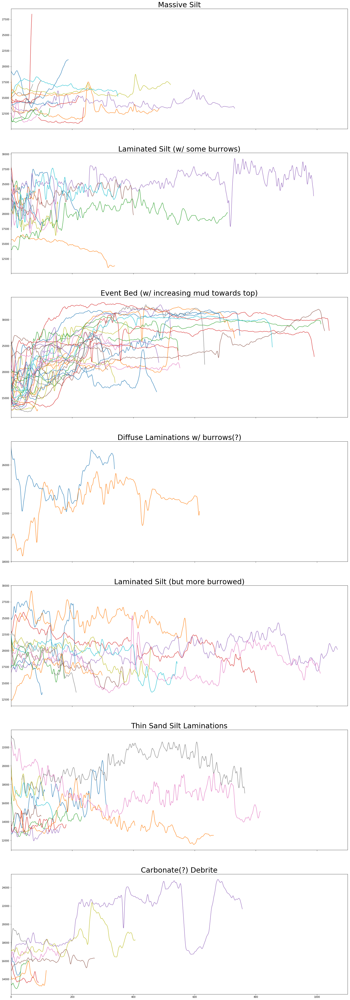

In [29]:
fig, ax = plt.subplots(7, figsize=(25,75), sharex=True)

train_curve = {}

for i, label in enumerate(d.keys()):
    label_name = label_names[int(label)]
    ax[i].set_title(label_name, fontsize=30)
    ax[i].set_xlim(0,1100)
    locs = d[label]
    arrs = []
    for start, end in locs:
        section = avg_lum[start:end]
        ax[i].plot(np.arange(0, end-start), section)
        arrs.append(section)
    train_curve[label_name] = arrs 
        

#plt.savefig('./event_curve_sections.png')
plt.show()

    

In [33]:
img = io.imread('./data/apache_7882.0-7932.0.png')

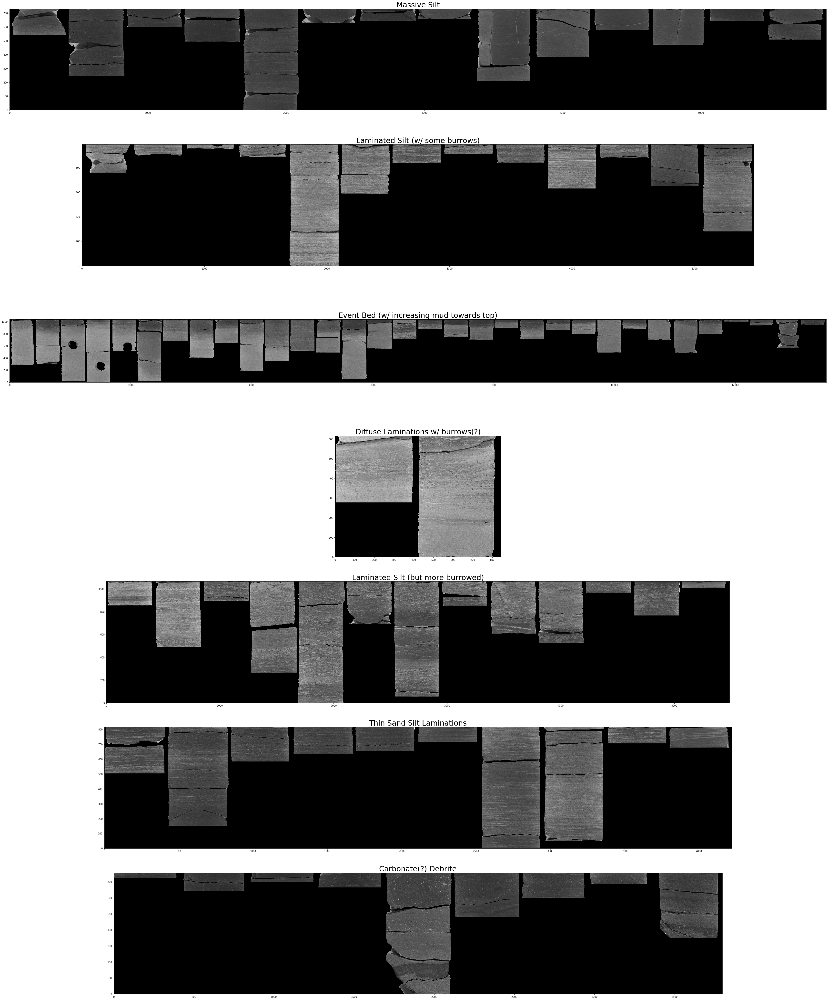

In [34]:
img_w = img.shape[1]

fig, ax = plt.subplots(7, figsize=(60,75))

train_imgs = {}

for i, label in enumerate(d.keys()): 
    label_name = label_names[int(label)]
    ax[i].set_title(label_name, fontsize=30)
    locs = d[label]
    n = len(locs)
    max_height = max(map(lambda loc: loc[1]-loc[0], locs))
    
    comp_img = np.zeros((max_height,n*img_w))
    
    imgs = []
    
    for j, (start, end) in enumerate(locs):
        section = img[start:end,:]
        comp_img[0:end-start,j*img_w:(j+1)*img_w] = section
    
    ax[i].set_ylim(0, max_height)
    ax[i].set_xlim(0,n*img_w)
    ax[i].imshow(comp_img[::-1,:], cmap='gray')
    
    train_imgs[label_name] = imgs

#plt.savefig('./event_image_sections.png')
plt.show()

In [36]:
labeled = np.zeros_like(avg_lum, dtype=np.bool)

for i, label in enumerate(d.keys()): 
    locs = d[label]
    for j, (start, end) in enumerate(locs):
        labeled[start:end] = True
        
test_image = img[np.logical_not(labeled), :]

In [38]:
img.shape, test_image.shape

((73601, 422), (38860, 422))

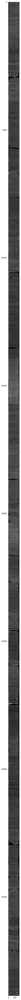

In [39]:
f, ax = plt.subplots(figsize=(5,100))
ax.imshow(test_image, cmap='gray')

# Breakpoints

In [68]:
import xml.etree.ElementTree as ET

def xml2pairs(fpath):
    '''Convert XML object labels file to a dict of {label: [start_row, end_row]}.'''
    tree = ET.parse(fpath)

    pairs = []

    for obj in tree.findall('object'):
        bbox = obj.find('bndbox')
        pairs.append( (eval(bbox.find('ymin').text), eval(bbox.find('ymax').text)) )

    return pairs


pairs = xml2pairs('./data/apache_7882.0-7932.0_labels.xml')
pts = sorted(list(sum(pairs, ())))
collapsed = [pts[i] for i in range(len(pts)-1) if (pts[i+1]-pts[i])<15]

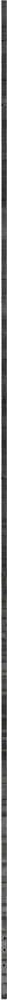

In [73]:
from skimage.segmentation import mark_boundaries

def mark_breakpoints(ycoords, image, estimated=False):
    '''Draw horizontal lines at ycoords over image.
       - uses yellows lines if estimated, else green 
    '''
     
    linecolor = (1,1,0) if estimated else (0,1,0) # ylw for est, grn otherwise 
    ycoords = [0] + ycoords + [image.shape[0]]
    label_img = np.zeros(image.shape[:2], dtype=np.uint)
    for i, (top, bot) in enumerate(zip(ycoords[:-1], ycoords[1:])):
        label_img[top:bot,:] = i

    return mark_boundaries(image, label_img, color=linecolor)


f, ax = plt.subplots(figsize=(10,500))

marked = mark_breakpoints(collapsed, img)

ax.imshow(marked)

In [72]:
collapsed

[41286,
 41629,
 41716,
 41805,
 42065,
 42545,
 42638,
 42795,
 42853,
 43205,
 43323,
 43845,
 43879,
 43951,
 44010,
 44110,
 44251,
 44341,
 44643,
 44685,
 44792,
 45037,
 45585,
 46144,
 46602,
 46936,
 47154,
 47253,
 48265,
 48420,
 48793,
 49345,
 49458,
 49702,
 49813,
 49999,
 50767,
 51092,
 51909,
 52645,
 52785,
 52888,
 53130,
 53293,
 53424,
 53607,
 53953,
 54185,
 54481,
 55147,
 55305,
 55791,
 56107,
 57181,
 57544,
 57862,
 58481,
 59285,
 59772,
 59950,
 60943,
 61519,
 62069,
 62226,
 62757,
 62836,
 63522,
 63674,
 64529,
 64929,
 65319,
 65529,
 66519,
 67153,
 67514,
 68539,
 68639,
 69163,
 69199,
 70241,
 70580,
 70678,
 71693,
 72427,
 73175,
 73403]

In [75]:
sorted(pairs)

[(5360, 5516),
 (6212, 6486),
 (7010, 7767),
 (15153, 15862),
 (34762, 35169),
 (35875, 35947),
 (41064, 41286),
 (41289, 41629),
 (41630, 41716),
 (41717, 41805),
 (41806, 42065),
 (42068, 42545),
 (42547, 42638),
 (42640, 42795),
 (42795, 42853),
 (42855, 43205),
 (43207, 43323),
 (43323, 43845),
 (43847, 43879),
 (43879, 43951),
 (43951, 44010),
 (44010, 44110),
 (44113, 44251),
 (44253, 44341),
 (44344, 44643),
 (44647, 44685),
 (44689, 44792),
 (44795, 45037),
 (45041, 45585),
 (45591, 46144),
 (46145, 46602),
 (46603, 46936),
 (46941, 47155),
 (47154, 47254),
 (47253, 48265),
 (48268, 48420),
 (48422, 48793),
 (48796, 49345),
 (49348, 49458),
 (49461, 49702),
 (49703, 49813),
 (49817, 49999),
 (50002, 50767),
 (50769, 51092),
 (51093, 51909),
 (51913, 52645),
 (52645, 52785),
 (52789, 52888),
 (52891, 53130),
 (53130, 53293),
 (53296, 53424),
 (53426, 53607),
 (53612, 53953),
 (53953, 54185),
 (54192, 54481),
 (54484, 55147),
 (55148, 55305),
 (55306, 55791),
 (55795, 56107),
 (5

In [91]:
colap = sorted(list(sum(pairs, ())))

In [82]:
np.zeros([3,2])

array([[0., 0.],
       [0., 0.],
       [0., 0.]])

In [83]:
l = [1,2]
l[:2]

[1, 2]

In [84]:
colap

[5360,
 5516,
 6212,
 6486,
 7010,
 7767,
 15153,
 15862,
 34762,
 35169,
 35875,
 35947,
 41064,
 41286,
 41289,
 41629,
 41630,
 41716,
 41717,
 41805,
 41806,
 42065,
 42068,
 42545,
 42547,
 42638,
 42640,
 42795,
 42795,
 42853,
 42855,
 43205,
 43207,
 43323,
 43323,
 43845,
 43847,
 43879,
 43879,
 43951,
 43951,
 44010,
 44010,
 44110,
 44113,
 44251,
 44253,
 44341,
 44344,
 44643,
 44647,
 44685,
 44689,
 44792,
 44795,
 45037,
 45041,
 45585,
 45591,
 46144,
 46145,
 46602,
 46603,
 46936,
 46941,
 47155,
 47154,
 47254,
 47253,
 48265,
 48268,
 48420,
 48422,
 48793,
 48796,
 49345,
 49348,
 49458,
 49461,
 49702,
 49703,
 49813,
 49817,
 49999,
 50002,
 50767,
 50769,
 51092,
 51093,
 51909,
 51913,
 52645,
 52645,
 52785,
 52789,
 52888,
 52891,
 53130,
 53130,
 53293,
 53296,
 53424,
 53426,
 53607,
 53612,
 53953,
 53953,
 54185,
 54192,
 54481,
 54484,
 55147,
 55148,
 55305,
 55306,
 55791,
 55795,
 56107,
 56113,
 57181,
 57185,
 57544,
 57545,
 57862,
 57864,
 58481

(array([72., 14.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  1.,  0.,  0.,  0.,
         0.,  2.,  0.,  0.,  0.,  2.,  1.,  0.,  1.,  3.,  0.,  5.]),
 array([  0.,   4.,   8.,  12.,  16.,  20.,  24.,  28.,  32.,  36.,  40.,
         44.,  48.,  52.,  56.,  60.,  64.,  68.,  72.,  76.,  80.,  84.,
         88.,  92.,  96., 100.]),
 <a list of 25 Patch objects>)

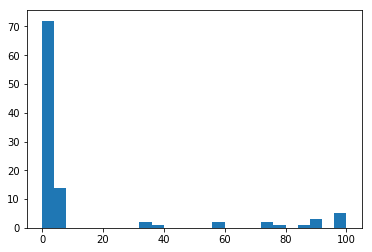

In [93]:
plt.hist(np.diff(colap), range=[0,100], bins=25)

In [106]:
np.array(colap)[np.where(np.diff(colap)>15)]

array([ 5360,  5516,  6212,  6486,  7010,  7767, 15153, 15862, 34762,
       35169, 35875, 35947, 41064, 41289, 41630, 41717, 41806, 42068,
       42547, 42640, 42795, 42855, 43207, 43323, 43847, 43879, 43951,
       44010, 44113, 44253, 44344, 44647, 44689, 44795, 45041, 45591,
       46145, 46603, 46941, 47155, 47254, 48268, 48422, 48796, 49348,
       49461, 49703, 49817, 50002, 50769, 51093, 51913, 52645, 52789,
       52891, 53130, 53296, 53426, 53612, 53953, 54192, 54484, 55148,
       55306, 55795, 56113, 57185, 57545, 57864, 58481, 59288, 59775,
       59951, 60943, 61522, 62072, 62230, 62760, 62837, 63524, 63676,
       64529, 64930, 65322, 65529, 66522, 67156, 67514, 68540, 68640,
       69164, 69200, 70241, 70582, 70679, 71695, 72427, 73176, 73403])

In [107]:
np.array(colap)

array([ 5360,  5516,  6212,  6486,  7010,  7767, 15153, 15862, 34762,
       35169, 35875, 35947, 41064, 41286, 41289, 41629, 41630, 41716,
       41717, 41805, 41806, 42065, 42068, 42545, 42547, 42638, 42640,
       42795, 42795, 42853, 42855, 43205, 43207, 43323, 43323, 43845,
       43847, 43879, 43879, 43951, 43951, 44010, 44010, 44110, 44113,
       44251, 44253, 44341, 44344, 44643, 44647, 44685, 44689, 44792,
       44795, 45037, 45041, 45585, 45591, 46144, 46145, 46602, 46603,
       46936, 46941, 47154, 47155, 47253, 47254, 48265, 48268, 48420,
       48422, 48793, 48796, 49345, 49348, 49458, 49461, 49702, 49703,
       49813, 49817, 49999, 50002, 50767, 50769, 51092, 51093, 51909,
       51913, 52645, 52645, 52785, 52789, 52888, 52891, 53130, 53130,
       53293, 53296, 53424, 53426, 53607, 53612, 53953, 53953, 54185,
       54192, 54481, 54484, 55147, 55148, 55305, 55306, 55791, 55795,
       56107, 56113, 57181, 57185, 57544, 57545, 57862, 57864, 58481,
       58481, 59285,

In [108]:
a= np.array([1,2])

In [109]:
a.tolist()

[1, 2]